<a href="https://colab.research.google.com/github/JauraSeerat/Wonder_Vision_Face_Detection/blob/master/FaceDetection(Abhishek%20Tandon)/FaceDet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

A Colab notebook to test various face detection models. 

Models tested -- 
1. OpenCV HAAR Classifier 
2. OpenCV LBP Classifier 
3. dlib HOG Classifier
4. OpenCV DNN Classifier - A ResNet10 based model.
5. dlib DNN Classifier 
6. cvlib -- A tensorflow based face detection library
6. Face Evolve 

The first row in the results show the model's performance on the images as it is. 
The second row in the results show the model's performance on the images which are first resized to (224 x 224) resolution size. 

Two models seem to perform really well on various images --

a. OpenCV DNN Classifier -- Provides almost accurate bounding box over the images when images are first resized to (224 x 224)

b. Face Evolve Classifier -- Based on MTCNN network this also provides almost accurate bounding box predictions. This also provides face landmarks information. 


Note -- 
1. Some of these images are taken from google for testing purposes. No copyright held by me. 
2. Scroll on the output block of the cells to see the results on various images 

Resources -- 
1. Face Evolve -- https://github.com/ZhaoJ9014/face.evoLVe.PyTorch 
2.  OpenCV -- https://github.com/opencv/opencv
3. Blog for implemnting OpenCV HAAR and LBP Classifiers  https://www.superdatascience.com/blogs/opencv-face-detection
4. Blog for implemnting OpenCV DNN, Dlib HOG and Dlib CNN Classifiers https://www.learnopencv.com/face-detection-opencv-dlib-and-deep-learning-c-python/
5. Cvlib documentation http://cvlib.net
6. MTCNN Paper: https://arxiv.org/pdf/1604.02878.pdf


In [0]:
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import warnings
warnings.filterwarnings('ignore')

In [0]:
# Make directory to hold all the files required for varioud models 
!mkdir ./face_det
!ls ./face_det/

In [0]:
#Get all the files related to various models and store them in the face_det directory created in the last step 

#getting OpenCV DNN model config file 
!wget https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/opencv_face_detector.pbtxt -O ./face_det/opencv_face_detector.pbtxt  
#getting OpenCV DNN model weights 
!wget https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20180220_uint8/opencv_face_detector_uint8.pb -O ./face_det/opencv_face_detector_uint8.pb

#getting dlib DNN face detector weights  
!wget https://github.com/davisking/dlib-models/raw/master/mmod_human_face_detector.dat.bz2 -O ./face_det/mmod_human_face_detector.dat.bz2
#unzipping the weight file
!bzip2 -d ./face_det/mmod_human_face_detector.dat.bz2  

#getting OpenCV HAAR Cascade Classifier model file 
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades_cuda/haarcascade_frontalface_alt.xml -O ./face_det/haarcascade_frontalface_alt.xml
  
#getting OpenCV LBP Cascade Classifier model file 
!wget https://raw.githubusercontent.com/opencv/opencv/master/data/lbpcascades/lbpcascade_frontalface_improved.xml -O ./face_det/lbpcascade_frontalface_improved.xml
  
#install cvlib -- a tensorflow based face detection library 
!pip install cvlib  

--2019-08-14 15:22:24--  https://raw.githubusercontent.com/opencv/opencv/master/samples/dnn/face_detector/opencv_face_detector.pbtxt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 34975 (34K) [text/plain]
Saving to: ‘./face_det/opencv_face_detector.pbtxt’

./face_det/opencv_f 100%[===================>]  34.16K  --.-KB/s    in 0.02s   

2019-08-14 15:22:24 (1.33 MB/s) - ‘./face_det/opencv_face_detector.pbtxt’ saved [34975/34975]

--2019-08-14 15:22:26--  https://raw.githubusercontent.com/opencv/opencv_3rdparty/dnn_samples_face_detector_20180220_uint8/opencv_face_detector_uint8.pb
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)

In [0]:
#Listing the face_det directory contents 
!ls ./face_det/

haarcascade_frontalface_alt.xml      opencv_face_detector.pbtxt
lbpcascade_frontalface_improved.xml  opencv_face_detector_uint8.pb
mmod_human_face_detector.dat


avg. time normal = 1.243  (secs) , avg. time resized = 0.063  (secs) 
1


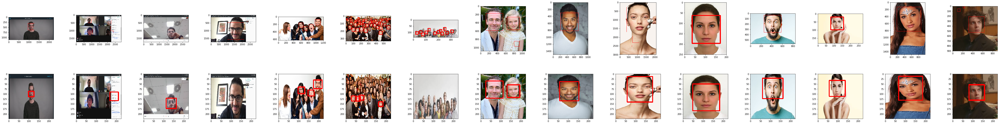

In [0]:
#OpenCV Haar Classifier

import cv2 
import matplotlib.pyplot as plt 
import time


#Change the img_path as per your folder -- Parent folder containing all the images listed in img_list
img_path = "/content/drive/My Drive//Colab//privateAI//Face//data//"

#List of all images on which the classifier needs to be tested 
img_list = ['day7.png','day9.png','day11.png','day13.png','face1.jpg','face2.jpg','face3.jpeg','face4.jpg','face5.jpeg','face6.jpg','face7.jpeg','face8.jpg','face9.jpeg','face10.jpeg','face11.jpg']
num_imgs = len(img_list)

#Creating a grid to visualize results of size 2 X num_imgs
gridsize = (2,num_imgs)
fig = plt.figure(figsize=(80,10))
plt.subplots_adjust(wspace=0.5,hspace=0.3)

#Loadign the HAAR Face Cascade Classifier Model file 
haar_face_cascade = cv2.CascadeClassifier('./face_det/haarcascade_frontalface_alt.xml')


time_normal = 0
image_list_normal = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB)
  H,W = image.shape[:2]
  img_gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
  faces = haar_face_cascade.detectMultiScale(img_gray)
  for face in faces:
    cv2.rectangle(image, (face[0], face[1]), (face[0] + face[2],face[1] + face[3]),(255,0,0),4) 
  t2 = time.time()
  time_normal = time_normal + (t2-t1)
  image_list_normal.append(image)
time_normal = round(time_normal/num_imgs,3)
  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (0, i))
  ax.grid(False)
  ax.imshow(image_list_normal[i])
  

time_resized = 0
image_list_resized = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.resize(cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB),(224,224))
  H,W = image.shape[:2]
  img_gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
  faces = haar_face_cascade.detectMultiScale(img_gray)
  for face in faces:
    cv2.rectangle(image, (face[0], face[1]), (face[0] + face[2],face[1] + face[3]),(255,0,0),4) 
  t2 = time.time()
  time_resized = time_resized + (t2-t1)
  image_list_resized.append(image)
time_resized = round(time_resized/num_imgs,3)  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (1, i))
  ax.grid(False)
  ax.imshow(image_list_resized[i])  

print ("avg. time normal = %r  (secs) , avg. time resized = %r  (secs) " %(time_normal,time_resized))


avg. time normal = 0.268  (secs) , avg. time resized = 0.041  (secs) 


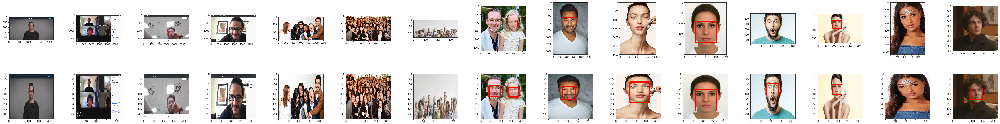

In [0]:
#OpenCV LBP Classifier

import cv2 
import matplotlib.pyplot as plt 
import time

#Change the img_path as per your folder -- Parent folder containing all the images listed in img_list
img_path = "/content/drive/My Drive//Colab//privateAI//Face//data//"
#List of all images on which the classifier needs to be tested 
img_list = ['day7.png','day9.png','day11.png','day13.png','face1.jpg','face2.jpg','face3.jpeg','face4.jpg','face5.jpeg','face6.jpg','face7.jpeg','face8.jpg','face9.jpeg','face10.jpeg','face11.jpg']
num_imgs = len(img_list)


#Creating a grid to visualize results of size 2 X num_imgs
gridsize = (2,num_imgs)
fig = plt.figure(figsize=(80,10))
plt.subplots_adjust(wspace=0.5,hspace=0.3)


#Loading OpenCV LBP Classifier Model file 
lbp_face_cascade = cv2.CascadeClassifier('./face_det/lbpcascade_frontalface_improved.xml')


time_normal = 0
image_list_normal = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB)
  H,W = image.shape[:2]
  img_gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
  faces = lbp_face_cascade.detectMultiScale(img_gray)
  for face in faces:
    cv2.rectangle(image, (face[0], face[1]), (face[0] + face[2],face[1] + face[3]),(255,0,0),4) 
  t2 = time.time()
  time_normal = time_normal + (t2-t1)
  image_list_normal.append(image)
time_normal = round(time_normal/num_imgs,3)
  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (0, i))
  ax.grid(False)
  ax.imshow(image_list_normal[i])
  

time_resized = 0
image_list_resized = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.resize(cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB),(224,224))
  H,W = image.shape[:2]
  img_gray = cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)
  faces = lbp_face_cascade.detectMultiScale(img_gray)
  for face in faces:
    cv2.rectangle(image, (face[0], face[1]), (face[0] + face[2],face[1] + face[3]),(255,0,0),4)
  t2 = time.time()
  time_resized = time_resized + (t2-t1)
  image_list_resized.append(image)
time_resized = round(time_resized/num_imgs,3)  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (1, i))
  ax.grid(False)
  ax.imshow(image_list_resized[i])  

print ("avg. time normal = %r  (secs) , avg. time resized = %r  (secs) " %(time_normal,time_resized))

avg. time normal = 1.446  (secs) , avg. time resized = 0.075  (secs) 


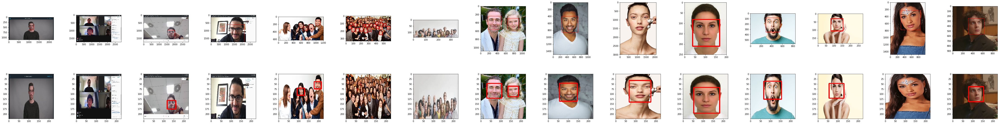

In [0]:
#dlib HOG detector 


import dlib 
import cv2
import matplotlib.pyplot as plt 
import time



#Change the img_path as per your folder -- Parent folder containing all the images listed in img_list 
img_path = "/content/drive/My Drive//Colab//privateAI//Face//data//"
#List of all images on which the classifier needs to be tested 
img_list = ['day7.png','day9.png','day11.png','day13.png','face1.jpg','face2.jpg','face3.jpeg','face4.jpg','face5.jpeg','face6.jpg','face7.jpeg','face8.jpg','face9.jpeg','face10.jpeg','face11.jpg']
num_imgs = len(img_list)


#Creating a grid to visualize results of size 2 X num_imgs
gridsize = (2,num_imgs)
fig = plt.figure(figsize=(80,10))
plt.subplots_adjust(wspace=0.5,hspace=0.3)

#Creating an instance of dlib HOG Face Detector 
hogFaceDetector = dlib.get_frontal_face_detector()

time_normal = 0
image_list_normal = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB)
  H,W = image.shape[:2]
  detections = hogFaceDetector(image,1)
  for face_rect in detections:
    x1 = face_rect.left()
    y1 = face_rect.top()
    x2 = face_rect.right()
    y2 = face_rect.bottom()
    cv2.rectangle(image, (x1, y1), (x2,y2),(255,0,0),4)
  t2 = time.time()
  time_normal = time_normal + (t2-t1)
  image_list_normal.append(image)
time_normal = round(time_normal/num_imgs,3)
  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (0, i))
  ax.grid(False)
  ax.imshow(image_list_normal[i])
  

time_resized = 0
image_list_resized = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.resize(cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB),(224,224))
  H,W = image.shape[:2]
  detections = hogFaceDetector(image,1)
  for face_rect in detections:
    x1 = face_rect.left()
    y1 = face_rect.top()
    x2 = face_rect.right()
    y2 = face_rect.bottom()
    cv2.rectangle(image, (x1, y1), (x2,y2),(255,0,0),4)
  t2 = time.time()
  time_resized = time_resized + (t2-t1)
  image_list_resized.append(image)
time_resized = round(time_resized/num_imgs,3)  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (1, i))
  ax.grid(False)
  ax.imshow(image_list_resized[i])  

print ("avg. time normal = %r  (secs) , avg. time resized = %r  (secs) " %(time_normal,time_resized))

avg. time normal = 0.074  (secs) , avg. time resized = 0.072  (secs) 


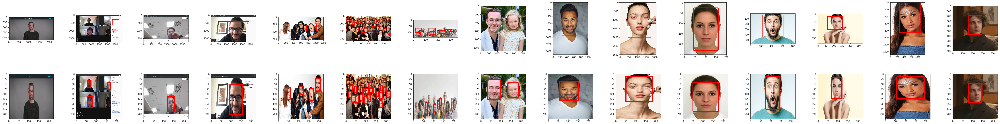

In [0]:
#OpenCV DNN Face Detection 

import cv2 
import matplotlib.pyplot as plt 
import time 


#Change the img_path as per your folder -  Parent folder containing all the images listed in img_list
img_path = "/content/drive/My Drive//Colab//privateAI//Face//data//"
#List of all images on which the classifier needs to be tested 
img_list = ['day7.png','day9.png','day11.png','day13.png','face1.jpg','face2.jpg','face3.jpeg','face4.jpg','face5.jpeg','face6.jpg','face7.jpeg','face8.jpg','face9.jpeg','face10.jpeg','face11.jpg']
num_imgs = len(img_list)


#Creating a grid to visualize results of size 2 X num_imgs
gridsize = (2,num_imgs)
fig = plt.figure(figsize=(80,10))
plt.subplots_adjust(wspace=0.5,hspace=0.3)


#Loading weights and config file of OpenCV DNN Classifier 
model_weights = "./face_det/opencv_face_detector_uint8.pb"
model_config = "./face_det/opencv_face_detector.pbtxt"
net = cv2.dnn.readNetFromTensorflow(model_weights,model_config)
conf_thresh = 0.5

time_normal = 0
image_list_normal = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB)
  H,W = image.shape[:2]
  image_blob = cv2.dnn.blobFromImage(image,1.0,(300,300),(104.0, 177.0, 123.0))
  net.setInput(image_blob)
  detections = net.forward()
  for i in range(detections.shape[2]):
    confidence = float(detections[:,:,i,2])
    if confidence > conf_thresh:
      x1 = int(detections[:,:,i,3] * W)
      y1 = int(detections[:,:,i,4] * H)
      x2 = int(detections[:,:,i,5] * W)
      y2 = int(detections[:,:,i,6] * H)
      y = y1 - 10 if (y1 - 10) > 10 else y1 + 10
      cv2.rectangle(image, (x1, y1), (x2,y2),(255, 0,0), 4)
  t2 = time.time()
  time_normal = time_normal + (t2-t1)
  image_list_normal.append(image)
time_normal = round(time_normal/num_imgs,3)
  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (0, i))
  ax.grid(False)
  ax.imshow(image_list_normal[i])
  

time_resized = 0
image_list_resized = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.resize(cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB),(224,224))
  H,W = image.shape[:2]
  image_blob = cv2.dnn.blobFromImage(image,1.0,(300,300),(104.0, 177.0, 123.0))
  net.setInput(image_blob)
  detections = net.forward()
  for i in range(detections.shape[2]):
    confidence = float(detections[:,:,i,2])
    if confidence > conf_thresh:
      x1 = int(detections[:,:,i,3] * W)
      y1 = int(detections[:,:,i,4] * H)
      x2 = int(detections[:,:,i,5] * W)
      y2 = int(detections[:,:,i,6] * H)
      cv2.rectangle(image, (x1, y1), (x2,y2),(255,0,0), 4)
  t2 = time.time()
  time_resized = time_resized + (t2-t1)
  image_list_resized.append(image)
time_resized = round(time_resized/num_imgs,3)  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (1, i))
  ax.grid(False)
  ax.imshow(image_list_resized[i])  

print ("avg. time normal = %r  (secs) , avg. time resized = %r  (secs) " %(time_normal,time_resized))



#Performs really well on resized images 
                           

avg. time normal = 0.769  (secs) , avg. time resized = 0.133  (secs) 


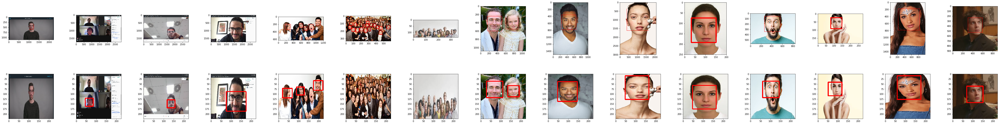

In [0]:
#dlib CNN face detector 


import dlib
import cv2 
import matplotlib.pyplot as plt
import time

#Change the img_path as per your folder -  Parent folder containing all the images listed in img_list
img_path = "/content/drive/My Drive//Colab//privateAI//Face//data//"
#List of all images on which the classifier needs to be tested 
img_list = ['day7.png','day9.png','day11.png','day13.png','face1.jpg','face2.jpg','face3.jpeg','face4.jpg','face5.jpeg','face6.jpg','face7.jpeg','face8.jpg','face9.jpeg','face10.jpeg','face11.jpg']
num_imgs = len(img_list)


#Creating a grid to visualize results of size 2 X num_imgs
gridsize = (2,num_imgs)
fig = plt.figure(figsize=(80,10))
plt.subplots_adjust(wspace=0.5,hspace=0.3)


#Creating an instance of Dlib CNN Face Detector Model
cnnFaceDetector = dlib.cnn_face_detection_model_v1("./face_det/mmod_human_face_detector.dat")

time_normal = 0
image_list_normal = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB)
  H,W = image.shape[:2]
  detections = cnnFaceDetector(image,1)
  for face_rect in detections:
    x1 = face_rect.rect.left()
    y1 = face_rect.rect.top()
    x2 = face_rect.rect.right()
    y2 = face_rect.rect.bottom()
    cv2.rectangle(image, (x1, y1), (x2,y2),(255,0,0),4)
  t2 = time.time()
  time_normal = time_normal + (t2-t1)
  image_list_normal.append(image)
time_normal = round(time_normal/num_imgs,3)
  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (0, i))
  ax.grid(False)
  ax.imshow(image_list_normal[i])
  

time_resized = 0
image_list_resized = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.resize(cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB),(224,224))
  H,W = image.shape[:2]
  detections = cnnFaceDetector(image,1)
  for face_rect in detections:
    x1 = face_rect.rect.left()
    y1 = face_rect.rect.top()
    x2 = face_rect.rect.right()
    y2 = face_rect.rect.bottom()
    cv2.rectangle(image, (x1, y1), (x2,y2),(255,0,0),4)
  t2 = time.time()
  time_resized = time_resized + (t2-t1)
  image_list_resized.append(image)
time_resized = round(time_resized/num_imgs,3)  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (1, i))
  ax.grid(False)
  ax.imshow(image_list_resized[i])  

print ("avg. time normal = %r  (secs) , avg. time resized = %r  (secs) " %(time_normal,time_resized))

avg. time normal = 0.065  (secs) , avg. time resized = 0.072  (secs) 


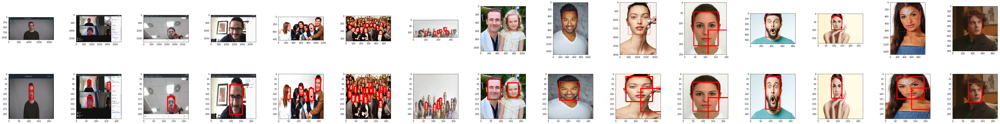

In [0]:
#cvlib Face Detector -- a library based on tensorflow 

import cvlib as cv 
import cv2
import matplotlib.pyplot as plt
import time 

#Change the img_path as per your folder -  Parent folder containing all the images listed in img_list
img_path = "/content/drive/My Drive//Colab//privateAI//Face//data//"
#List of all images on which the classifier needs to be tested 
img_list = ['day7.png','day9.png','day11.png','day13.png','face1.jpg','face2.jpg','face3.jpeg','face4.jpg','face5.jpeg','face6.jpg','face7.jpeg','face8.jpg','face9.jpeg','face10.jpeg','face11.jpg']
num_imgs = len(img_list)


#Creating a grid to visualize results of size 2 X num_imgs
gridsize = (2,num_imgs)
fig = plt.figure(figsize=(80,10))
plt.subplots_adjust(wspace=0.5,hspace=0.3)


time_normal = 0
image_list_normal = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB)
  H,W = image.shape[:2]
  faces, confidences = cv.detect_face(image)
  for face in faces:
    cv2.rectangle(image, (face[0], face[1]), (face[2],face[3]),(255,0,0),4) 
  t2 = time.time()
  time_normal = time_normal + (t2-t1)
  image_list_normal.append(image)
time_normal = round(time_normal/num_imgs,3)
  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (0, i))
  ax.grid(False)
  ax.imshow(image_list_normal[i])
  

time_resized = 0
image_list_resized = list()
for img_name in img_list:
  t1 = time.time()
  image = cv2.resize(cv2.cvtColor(cv2.imread(img_path + img_name),cv2.COLOR_BGR2RGB),(224,224))
  H,W = image.shape[:2]
  faces, confidences = cv.detect_face(image)
  for face in faces:
    cv2.rectangle(image, (face[0], face[1]), (face[2],face[3]),(255,0,0),4) 
  t2 = time.time()
  time_resized = time_resized + (t2-t1)
  image_list_resized.append(image)
time_resized = round(time_resized/num_imgs,3)  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (1, i))
  ax.grid(False)
  ax.imshow(image_list_resized[i])  

print ("avg. time normal = %r  (secs) , avg. time resized = %r  (secs) " %(time_normal,time_resized))

In [0]:
#Getting files require to run Face Evolve model based on MTCNN for Face Detection 

!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/align_trans.py -O ./align_trans.py
!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/box_utils.py -O ./box_utils.py
!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/detector.py -O ./detector.py
!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/face_align.py -O ./face_align.py
!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/face_resize.py -O ./face_resize.py
!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/first_stage.py -O ./first_stage.py
!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/get_nets.py -O ./get_nets.py
!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/matlab_cp2tform.py -O ./matlab.cpt2tform.py
  
#Getting the weights of three models Onet, Pnet and Rnet 
!wget https://github.com/ZhaoJ9014/face.evoLVe.PyTorch/raw/master/align/onet.npy -O ./onet.npy
!wget https://github.com/ZhaoJ9014/face.evoLVe.PyTorch/raw/master/align/pnet.npy -O ./pnet.npy
!wget https://github.com/ZhaoJ9014/face.evoLVe.PyTorch/raw/master/align/rnet.npy -O ./rnet.npy
  
!wget https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/visualization_utils.py -O ./visualization_utils.py


--2019-08-14 14:07:22--  https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/align_trans.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10865 (11K) [text/plain]
Saving to: ‘./align_trans.py’

./align_trans.py    100%[===================>]  10.61K  --.-KB/s    in 0s      

2019-08-14 14:07:22 (156 MB/s) - ‘./align_trans.py’ saved [10865/10865]

--2019-08-14 14:07:23--  https://raw.githubusercontent.com/ZhaoJ9014/face.evoLVe.PyTorch/master/align/box_utils.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6926 (6.

In [0]:
!ls

avg. time normal = 1.143  (secs) , avg. time resized = 0.117  (secs) 


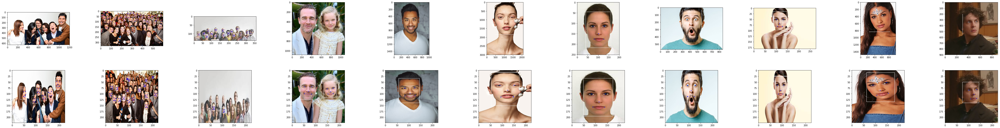

In [0]:
#Face Evolve -- Pytorch 

from PIL import Image 
from detector import detect_faces
from visualization_utils import show_results
import matplotlib.pyplot as plt 
import time


#Change the img_path as per your folder -  Parent folder containing all the images listed in img_list
img_path = "/content/drive/My Drive//Colab//privateAI//Face//data//"
#List of all images on which the classifier needs to be tested 
img_list = ['face1.jpg','face2.jpg','face3.jpeg','face4.jpg','face5.jpeg','face6.jpg','face7.jpeg','face8.jpg','face9.jpeg','face10.jpeg','face11.jpg']
num_imgs = len(img_list)


#Creating a grid to visualize results of size 2 X num_imgs
gridsize = (2,num_imgs)
fig = plt.figure(figsize=(80,10))
plt.subplots_adjust(wspace=0.5,hspace=0.3)


time_normal = 0
image_list_normal = list()
for k,img_name in enumerate(img_list):
  t1 = time.time()
  image = Image.open(img_path + img_name)
  #H,W = image.shape[:2]
  bounding_boxes, landmarks = detect_faces(image)
  img_res = show_results(image, bounding_boxes, landmarks)    
  t2 = time.time()
  time_normal = time_normal + (t2-t1)
  image_list_normal.append(img_res)
time_normal = round(time_normal/num_imgs,3)
  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (0, i))
  ax.grid(False)
  ax.imshow(image_list_normal[i])
  

time_resized = 0
image_list_resized = list()
for img_name in img_list:
  t1 = time.time()
  image = Image.open(img_path + img_name)
  image = image.resize((224,224), Image.ANTIALIAS)
  #H,W = image.shape[:2]
  bounding_boxes, landmarks = detect_faces(image)
  img_res = show_results(image, bounding_boxes, landmarks) 
  t2 = time.time()
  time_resized = time_resized + (t2-t1)
  image_list_resized.append(img_res)
time_resized = round(time_resized/num_imgs,3)  
  
for i in range(num_imgs):
  ax = plt.subplot2grid(gridsize, (1, i))
  ax.grid(False)
  ax.imshow(image_list_resized[i])  

print ("avg. time normal = %r  (secs) , avg. time resized = %r  (secs) " %(time_normal,time_resized))

In [0]:
#Testing OpenCV DNN Classifier on a video -- Video available at https://www.videvo.net/video/woman-carrying-basket-on-head/7525/

import imutils
import numpy as np


#Load the face video as per your directory path 
vs = cv2.VideoCapture('/content/drive/My Drive//Colab//privateAI//Face//data//facevid.mp4')
writer = None
(W, H) = (None, None)


while True:
  (grabbed, frame) = vs.read()
  if not grabbed:
    break
  #image = cv2.resize(frame,(224,224))    
  image = frame
  H,W = image.shape[:2]
  image_blob = cv2.dnn.blobFromImage(image,1.0,(300,300),(104.0, 177.0, 123.0))
  net.setInput(image_blob)
  detections = net.forward()
  for i in range(detections.shape[2]):
    confidence = float(detections[:,:,i,2])
    if confidence > conf_thresh:
      x1 = int(detections[:,:,i,3] * W)
      y1 = int(detections[:,:,i,4] * H)
      x2 = int(detections[:,:,i,5] * W)
      y2 = int(detections[:,:,i,6] * H)
      cv2.rectangle(image, (x1, y1), (x2,y2),(255,0,0), 4)
  if writer is None:
    fourcc = cv2.VideoWriter_fourcc(*"MJPG")
    
    #saving the frame of the video at the desired path 
    writer = cv2.VideoWriter('/content/drive/My Drive//Colab//privateAI//Face//data//outvid1.avi', fourcc, 30,(image.shape[1], image.shape[0]), True)  
  writer.write(image)
writer.release()
vs.release() 
print ('done')  